In [8]:
#Importing the Libraries
import pandas as pd                
import numpy as np                   
import sys; 
import statsmodels
import sklearn
import scipy; 
import pip;
from datetime import datetime
from time import sleep

# Matplotlib is for plotting graphs
import matplotlib.pyplot as plt    
# matplotlib inline will display the graphs right below the cell
%matplotlib inline                 

#Pylab and seaborn for plots
from pylab import rcParams
import seaborn as sns; sns.set()
from seaborn import scatterplot
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)


#To ignore warnings
import warnings
warnings.filterwarnings("ignore")

pd.set_option('mode.chained_assignment', None)
#display complete outputs
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [0]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from imblearn.under_sampling import NearMiss
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from collections import Counter

#### Import dataset, check the number of records, columns and view the top 5 rows

In [10]:
rawData = pd.read_csv("data.csv")
rawData.shape

(284807, 30)

In [11]:
rawData.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,Class
0,NaN,-0.072781,2.536347,NaN,-0.338321,0.462388,NaN,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,NaN,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,NaN,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,NaN,-0.166974,NaN,1.065235,NaN,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,NaN,-0.225775,-0.638672,NaN,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,NaN,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,NaN,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,NaN,-0.451449,NaN,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [12]:
# Checking number of unique classes:
rawData.Class.unique()

array([0, 1])

#### Insights:

1. We see presence of Nans across most columns.

2. Column V29 has higher values than V1 - V28.

3. This a binary classification problem.

4. As a data qualtiy check procedure, we check for amount of values missing, imputation possibilities, number of outliers, removal of outliers.

In [13]:
#Checking number of missing values:
rawData.isna().sum()

V1       28480
V2       28480
V3       28480
V4       28480
V5       28480
V6       28480
V7       28480
V8       28480
V9       28480
V10      28480
V11      28480
V12      28480
V13      28480
V14      28480
V15      28480
V16      28480
V17      28480
V18      28480
V19      28480
V20      28480
V21      28480
V22      28480
V23      28480
V24      28480
V25      28480
V26      28480
V27      28480
V28      28480
V29      28480
Class        0
dtype: int64

In [14]:
def missingValuePercent(data):
    return(100*data.isna().sum()/ len(data))
missingValuePercent(rawData)

V1       9.999754
V2       9.999754
V3       9.999754
V4       9.999754
V5       9.999754
V6       9.999754
V7       9.999754
V8       9.999754
V9       9.999754
V10      9.999754
V11      9.999754
V12      9.999754
V13      9.999754
V14      9.999754
V15      9.999754
V16      9.999754
V17      9.999754
V18      9.999754
V19      9.999754
V20      9.999754
V21      9.999754
V22      9.999754
V23      9.999754
V24      9.999754
V25      9.999754
V26      9.999754
V27      9.999754
V28      9.999754
V29      9.999754
Class    0.000000
dtype: float64

In [0]:
aaa = missingValuePercent(rawData)


Text(0, 0.5, 'Percentage of missing values')

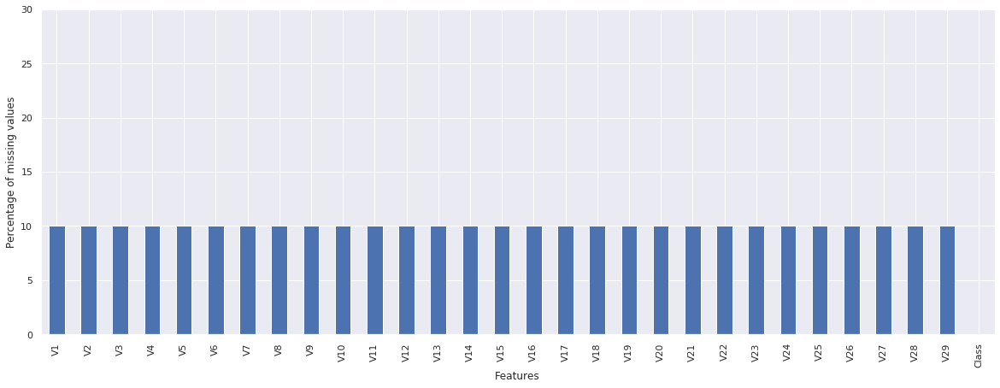

In [16]:
aaa.plot( kind="bar", figsize=(20,7), ylim = [0,30] )

plt.xlabel('Features')
plt.ylabel('Percentage of missing values')

#### Insights:

1. Almost 10% of values are missing. 

2. However, we need to check the total number of records affected by missing values.

#### Check distribution of Classes:

In [17]:
rawZero = rawData[rawData.Class == 0]
rawOne = rawData[rawData.Class == 1]
print(len(rawOne))
print(len(rawZero))

492
284315


In [0]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [19]:
enable_plotly_in_cell()

trace = go.Pie(labels = ['Fraud', 'Not Fraud'] ,
               values = [rawOne.shape[0], rawZero.shape[0]],
               textfont=dict(size=18),

               text = ['Fraud cases: '+ str(rawOne.shape[0]), 'Normal cases: ' + str(rawZero.shape[0])],
               hoverinfo = "label+value",
              )
layout = go.Layout(dict(dict(title = "Distribution" ,font=dict(
                family='sans-serif',size=15)),legend=dict(x=.8, y=1, font=dict(family='sans-serif',size=15)),
                        plot_bgcolor  = "rgb(243,243,243)",
                        )
                  )
                      
                  
pieD = [trace]
fig = go.Figure(data = pieD,layout = layout)
iplot(fig)

In [20]:
dropAllOne = rawOne.dropna()
dropAllZero = rawZero.dropna()
print(len(dropAllOne))
print(len(dropAllZero))

27
13462


In [21]:
enable_plotly_in_cell()

trace = go.Pie(labels = ['Fraud', 'Not Fraud'] ,
               values = [dropAllOne.shape[0], dropAllZero.shape[0]],
               textfont=dict(size=18),
              #  marker = dict(colors =  [ 'red' ,'green'],
              #                line = dict(color = "black",
              #                            width =  0.1)
              #               ),
               text = ['Fraud cases: '+ str(dropAllOne.shape[0]), 'Normal cases: ' + str(dropAllZero.shape[0])],
               hoverinfo = "label+value",               
              )

layout = go.Layout(dict(dict(title = "Distribution" ,font=dict(
                family='sans-serif',size=15)),legend=dict(x=.8, y=1, font=dict(family='sans-serif',size=15)),
                        plot_bgcolor  = "rgb(243,243,243)",
                        )
                  )
                      
                  
pieD = [trace]
fig = go.Figure(data = pieD,layout = layout)

iplot(fig)

#### Insights:
1. As suspected, missing values have a larger effect throughout the dataset.

2. We need to impute missing values. 

3. The column V29 can be explored for this.

In [22]:
noNullOne29 = rawOne.dropna(subset=['V29'])
noNullZero29 = rawZero.dropna(subset=['V29'])
print(len(noNullOne29))
print(len(noNullZero29))

441
255886


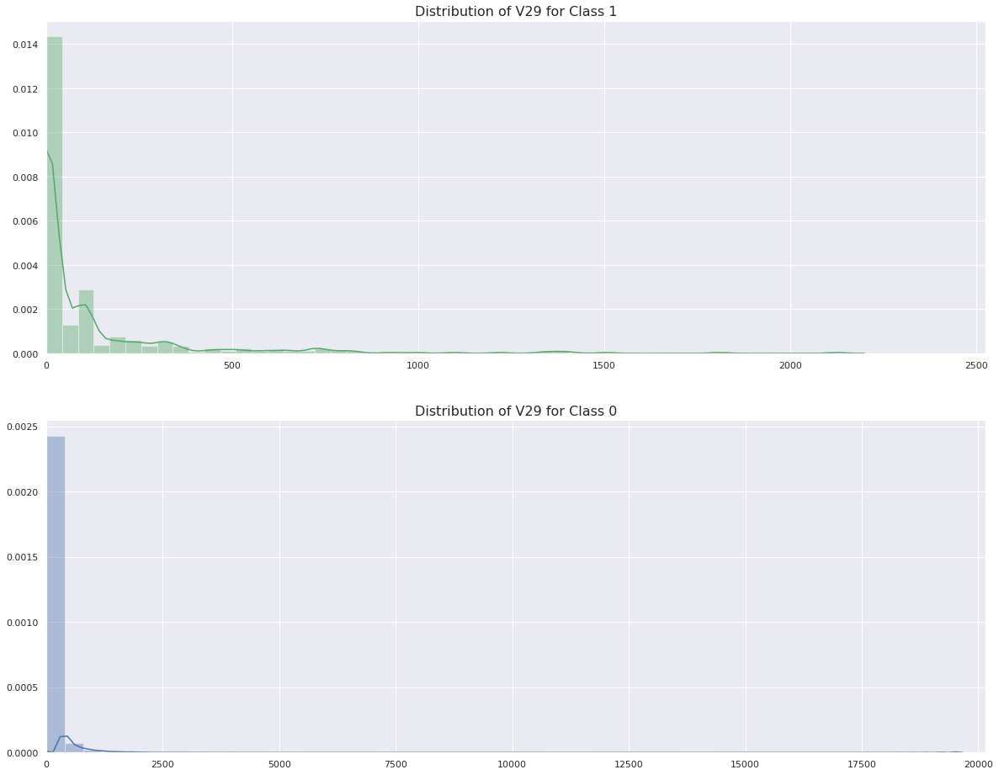

In [23]:
fig, ax = plt.subplots(2, 1, figsize=(20,16))

OneV29 = noNullOne29['V29'].values
ZeroV29 = noNullZero29['V29'].values

sns.distplot(OneV29, ax=ax[0], color='g')
ax[0].set_title('Distribution of V29 for Class 1', fontsize=16)
ax[0].set_xlim([min(OneV29), max(OneV29)+ 400])

sns.distplot(ZeroV29, ax=ax[1], color='b')
ax[1].set_title('Distribution of V29 for Class 0', fontsize=16)
ax[1].set_xlim([min(ZeroV29), max(ZeroV29) + 500])

plt.show()

In [24]:
print(max(noNullOne29.V29))
print(min(noNullOne29.V29))
print(max(noNullZero29.V29))
print(min(noNullZero29.V29))

2125.87
0.0
19656.53
0.0


### Imputation:

1. We will be categorizing this continuous variable V29 into multiple bins.

2. Each bin size would be 20. We could increase the bin size to a larger number like 40 or 60 and try including large records, however, to lean towards accuracy we stick to 20 bins.

3. Since the mean would be affected by Outliers, which can be seen are present in both Classes, we would take the median for imputation.

4. This median would be the median of each group of records that would fall under the various bins we create.

In [25]:
# We calculate the next integer divisible by 20 to get the upper limit for bins
ubinOne = int( 20 * round(max(noNullOne29.V29) / 20. ) + 20)
ubinZero = int( 20 * round(max(noNullZero29.V29) / 20. ) + 20)
print(ubinOne)
print(ubinZero)

2140
19680


In [0]:
bins1 = np.arange(0, ubinOne, 20)
labels1 = bins1[1:]
bins0 = np.arange(0, ubinZero, 20)
labels0 = bins0[1:]

In [0]:
# We create a column 'bins'
noNullOne29['bins'] = pd.cut(x=noNullOne29['V29'], bins=bins1, labels=labels1)
noNullZero29['bins'] = pd.cut(x=noNullZero29['V29'], bins=bins0, labels=labels0)

#For the first group 0-20 we see Nans, therefore, we assign bin 0: 
noNullOne29['bins'] = noNullOne29['bins'].replace(np.nan, 0)
noNullZero29['bins'] = noNullZero29['bins'].replace(np.nan, 0)

In [28]:
noNullOne29.tail()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,Class,bins
279863,-1.927883,1.125653,-4.518331,NaN,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,2.115795,-5.417424,NaN,-6.665177,NaN,-2.897825,-4.570529,-1.315147,0.391167,1.252967,0.778584,-0.319189,0.639419,NaN,0.537503,0.788395,0.292680,0.147968,390.00,1,400.0
280143,NaN,1.289381,-5.004247,1.411850,0.442581,NaN,-1.413170,0.248525,-1.127396,-3.232153,2.858466,-3.096915,-0.792532,NaN,-0.613803,-2.155297,-3.267116,-0.688505,NaN,0.226138,0.370612,NaN,-0.145640,-0.081049,NaN,0.739467,0.389152,0.186637,0.76,1,20.0
280149,-0.676143,NaN,NaN,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,1.794969,-2.775022,NaN,-4.057162,-0.712616,-1.603015,-5.035326,-0.507000,0.266272,0.247968,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,77.89,1,80.0
281144,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,1.933520,-5.030465,-1.127455,-6.416628,0.141237,-2.549498,-4.614717,-1.478138,NaN,NaN,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,245.00,1,260.0
281674,1.991976,0.158476,-2.583441,0.408670,1.151147,-0.096695,0.223050,-0.068384,0.577829,-0.888722,0.491140,0.728903,0.380428,-1.948883,-0.832498,0.519436,0.903562,1.197315,0.593509,-0.017652,-0.164350,-0.295135,-0.072173,-0.450261,0.313267,-0.289617,0.002988,-0.015309,42.53,1,60.0


In [0]:
dispnonullOne = pd.DataFrame({'V29': noNullOne29['V29'] , 'Bins' :noNullOne29['bins']})


In [30]:
dispnonullOne.tail()


,V29,Bins
279863,390.00,400.0
280143,0.76,20.0
280149,77.89,80.0
281144,245.00,260.0
281674,42.53,60.0


In [31]:
noNullZero29.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,Class,bins
0,NaN,-0.072781,2.536347,NaN,-0.338321,0.462388,NaN,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,NaN,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,NaN,-0.021053,149.62,0,160.0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,NaN,-0.166974,NaN,1.065235,NaN,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,NaN,-0.225775,-0.638672,NaN,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,20.0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,NaN,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,380.0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,140.0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,NaN,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,NaN,-0.451449,NaN,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,80.0


In [0]:
dispnonullZero = pd.DataFrame({'V29': noNullZero29['V29'] , 'Bins' :noNullZero29['bins']})


In [33]:
dispnonullZero.head()

,V29,Bins
0,149.62,160.0
1,2.69,20.0
2,378.66,380.0
3,123.50,140.0
4,69.99,80.0


In [0]:
testOne = noNullOne29.groupby(['bins']).transform(lambda x: x.replace(np.nan,x.median()))
testZero = noNullZero29.groupby(['bins']).transform(lambda x: x.replace(np.nan,x.median()))

In [35]:
print(testOne.shape)
print(testZero.shape)



(441, 30)
(255886, 30)


In [36]:
testZero.head(1)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,Class
0,0.817468,-0.072781,2.536347,-0.117331,-0.338321,0.462388,-0.076056,0.098698,0.363787,0.090794,-0.5516,-0.617801,-0.99139,-0.311169,1.468177,-0.470401,-0.058339,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,-0.004386,-0.021053,149.62,0


In [37]:
grp = noNullOne29.groupby(['bins'])
grp.describe()

V1                                                        \
        count       mean       std        min        25%        50%   
bins                                                                  
0.0      25.0  -2.847066  6.033111 -28.255053  -4.991758  -0.937843   
20.0    189.0  -3.971239  6.366951 -26.457745  -4.641893  -1.863756   
40.0     22.0  -3.893797  5.166852 -15.020981  -6.845862  -1.209848   
60.0     13.0  -5.210369  5.842691 -18.247513  -6.185857  -4.312479   
80.0      5.0  -3.068985  4.603094 -10.850282  -3.218952  -1.548788   
100.0    35.0 -13.830386  9.996603 -30.552380 -22.223520 -12.381048   
120.0    17.0  -4.939772  4.598388 -15.140450  -6.677212  -4.844372   
140.0     8.0  -3.319863  6.507413 -19.139733  -2.546019  -1.194984   
160.0     4.0  -3.100273  3.627699  -7.901421  -4.063254  -2.706394   
180.0     4.0  -4.195953  5.009475 -11.682215  -4.624908  -1.935965   
200.0     6.0  -6.847846  5.260662 -12.339603 -10.632375  -8.492356   
220.0     4.0  -4.068349  2.581692  -6.750509  -5.904479  -4.206620   
240.0     4.0  -3.406253  2.669487  -6.682832  -4.819759  -3.251042   
260.0     6.0  -5.092844  1.991192  -6.713407  -6.689128  -5.904395   
280.0     3.0  -6.182840  8.299338 -14.970346 -10.035301  -5.100256   
300.0     3.0  -4.249766  3.127845  -6.133987  -6.055053  -5.976119   
320.0     7.0  -4.755561  2.391814  -8.257111  -5.921307  -5.839192   
340.0     3.0  -1.735737  1.435231  -3.367770  -2.268486  -1.169203   
360.0     5.0  -0.850116  1.641109  -2.877176  -1.554216  -1.374424   
380.0     1.0 -16.526507       NaN -16.526507 -16.526507 -16.526507   
400.0     1.0  -1.927883       NaN  -1.927883  -1.927883  -1.927883   
440.0     1.0  -3.170818       NaN  -3.170818  -3.170818  -3.170818   
460.0     2.0  -5.668503  4.713359  -9.001351  -7.334927  -5.668503   
500.0     2.0  -1.092861  1.034403  -1.824295  -1.458578  -1.092861   
520.0     2.0  -1.514650  0.583791  -1.927453  -1.721051  -1.514650   
560.0     1.0  -0.758469       NaN  -0.758469  -0.758469  -0.758469   
580.0     1.0   0.842025       NaN   0.842025   0.842025   0.842025   
600.0     1.0  -4.861747       NaN  -4.861747  -4.861747  -4.861747   
620.0     1.0  -1.662937       NaN  -1.662937  -1.662937  -1.662937   
640.0     2.0  -1.564085  0.654852  -2.027135  -1.795610  -1.564085   
660.0     1.0  -4.423508       NaN  -4.423508  -4.423508  -4.423508   
680.0     1.0  -2.405207       NaN  -2.405207  -2.405207  -2.405207   
740.0     6.0  -3.029524  3.061065  -8.744415  -2.888270  -2.571798   
780.0     1.0  -5.187878       NaN  -5.187878  -5.187878  -5.187878   
820.0     1.0  -2.144411       NaN  -2.144411  -2.144411  -2.144411   
840.0     1.0  -1.360293       NaN  -1.360293  -1.360293  -1.360293   
940.0     0.0        NaN       NaN        NaN        NaN        NaN   
1000.0    1.0  -1.611877       NaN  -1.611877  -1.611877  -1.611877   
1100.0    1.0  -0.082983       NaN  -0.082983  -0.082983  -0.082983   
1220.0    1.0 -12.224021       NaN -12.224021 -12.224021 -12.224021   
1340.0    1.0  -1.212682       NaN  -1.212682  -1.212682  -1.212682   
1360.0    1.0  -2.923827       NaN  -2.923827  -2.923827  -2.923827   
1400.0    1.0  -2.326922       NaN  -2.326922  -2.326922  -2.326922   
1420.0    1.0  -5.344665       NaN  -5.344665  -5.344665  -5.344665   
1520.0    1.0  -1.600211       NaN  -1.600211  -1.600211  -1.600211   
1820.0    1.0  -3.499108       NaN  -3.499108  -3.499108  -3.499108   

                                 V2                                          \
              75%        max  count      mean       std       min       25%   
bins                                                                          
0.0      0.745153   1.204934   25.0  2.243648  3.282615 -8.402154  1.728735   
20.0     0.290155   2.091900  197.0  4.133654  4.272409 -6.976420  1.435305   
40.0    -0.743020   1.707857   22.0  2.300853  3.592710 -7.449015  0.646320   
60.0    -1.111495   1.991976   13.0  3.828106  3.137144 -

In [38]:

testOne.isna().sum()

V1       1
V2       1
V3       3
V4       4
V5       1
V6       4
V7       2
V8       1
V9       0
V10      1
V11      1
V12      3
V13      2
V14      0
V15      3
V16      2
V17      0
V18      0
V19      3
V20      2
V21      1
V22      2
V23      1
V24      2
V25      1
V26      5
V27      0
V28      1
V29      0
Class    0
dtype: int64

In [39]:
testZero.isna().sum()

V1        2
V2        4
V3       14
V4        5
V5        7
V6        6
V7       11
V8        4
V9        4
V10       5
V11      10
V12       3
V13      10
V14       7
V15      14
V16       7
V17       3
V18       5
V19       7
V20       8
V21      10
V22      12
V23       6
V24       4
V25       5
V26       7
V27       9
V28       6
V29       0
Class     0
dtype: int64

Text(0, 0.5, 'Number of missing values')

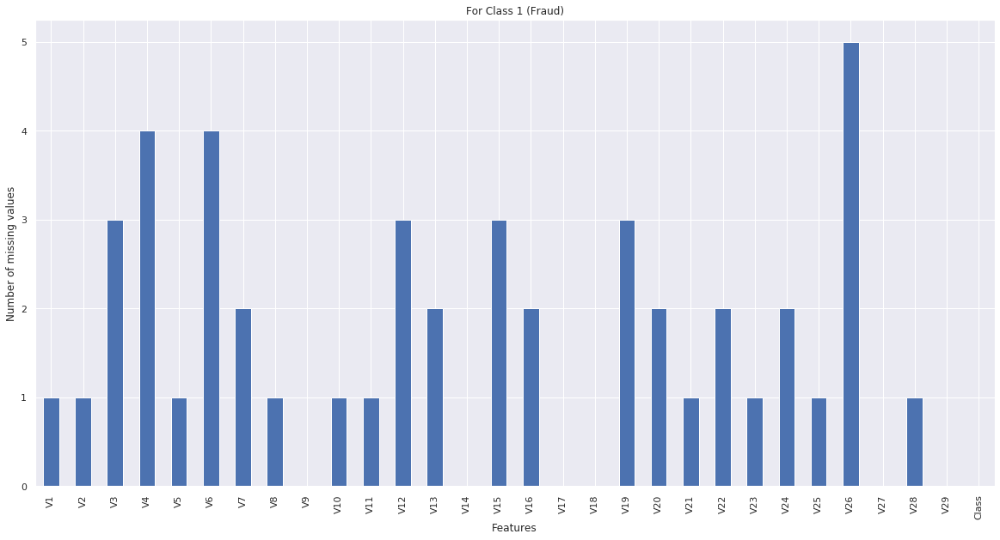

In [40]:
atto = testOne.isna().sum()
atto.plot(kind="bar", figsize=(20,10))
plt.title('For Class 1 (Fraud)')
plt.xlabel('Features')
plt.ylabel('Number of missing values')


Text(0, 0.5, 'Number of missing values')

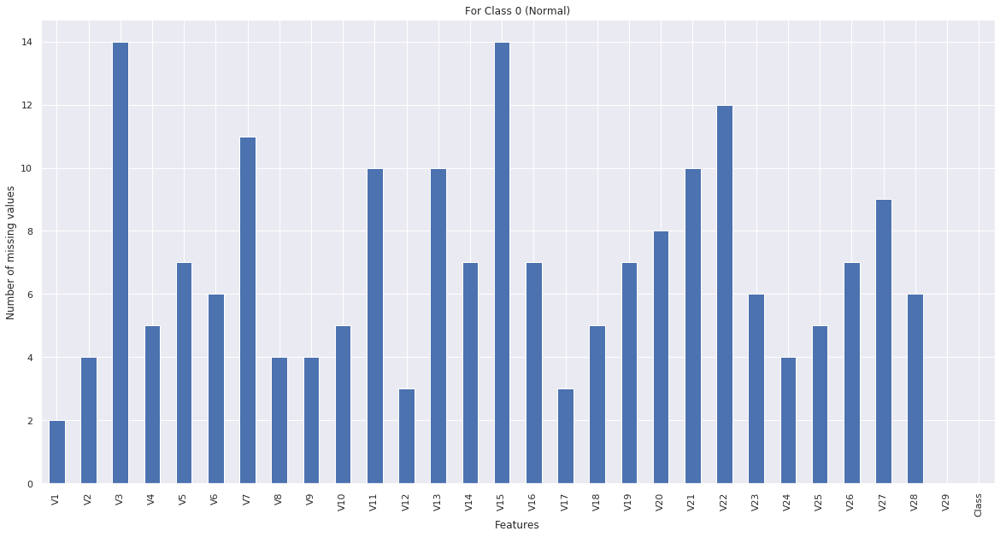

In [41]:
attz = testZero.isna().sum()
attz.plot(kind="bar", figsize=(20,10))
plt.title('For Class 0 (Normal)')
plt.xlabel('Features')
plt.ylabel('Number of missing values')

 V29 is the only column which is not scaled. Thus, there's a lot we could do from it. Imputing V29 median doesnt make sense because the amount has very high variation. Also, dropping only the V29 nans does not reduce the data significantly. 

Furthermore, categorizing with bins, helps to small groups of rows(samples/patterns) with similar traits. 
And thus, the nans from a particular group are replaced by the median of only those patterns with similar traits. And hence, maintaining accuracy of imputation. 

Larger bin size would have eliminated almost all nans but  accuracy of imputation  would be decreased, thus we fix it at 20. 

And as seen in the next slide, after imputation, the 10% missing values are dropped down to less than 1%, i.e 0- 5 missing out of 441 rows for Fraud class, and about 0 - 14 missing out of 255886 for Normal class. 




#### Insights:

1. After this method, we ended up imputing majority of missing values.

2. We can still see few Nans, which means there weren't valid values in few bins.

3. We could increase the bin size to a larger number like 40 or 60 and try including large records, however, to lean towards accuracy we stick to 20 bins.

4. The remaining missing values will now be dropped.

In [0]:
testOneClean = testOne.dropna()
testZeroClean = testZero.dropna()

In [116]:
print("Number of records in Class 1 before imputation: {}".format(len(rawOne)))

print("Number of records in Class 1 after imputation: {}".format(len(testOne)))
print("Number of records in Class 1 after imputation and dropping residual nans: {} \n".format(len(testOneClean)))

print("Number of records in Class 0 before imputation: {}".format(len(rawZero)))
print("Number of records in Class 0 after imputation: {}".format(len(testZero)))
print("Number of records in Class 0 after imputation and dropping residual nans: {}".format(len(testZeroClean)))

Number of records in Class 1 before imputation: 492
Number of records in Class 1 after imputation: 441
Number of records in Class 1 after imputation and dropping residual nans: 423 

Number of records in Class 0 before imputation: 284315
Number of records in Class 0 after imputation: 255886
Number of records in Class 0 after imputation and dropping residual nans: 255807


In [0]:
testSetClean = pd.concat([testZeroClean, testOneClean])

In [45]:
testSetClean.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,Class
count,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000
mean,0.022103,0.000028,0.019373,-0.002804,-0.009143,-0.025366,-0.000403,0.003875,-0.009028,-0.010750,-0.003247,0.014682,0.000178,0.003077,0.003435,0.004639,-0.006354,-0.000341,0.000550,-0.000317,-0.001503,-0.000579,-0.002493,0.004664,0.001769,-0.003138,-0.000004,0.001652,86.675432,0.001651
std,1.850983,1.556539,1.437334,1.344732,1.281745,1.252222,1.138677,1.129904,1.043768,1.029988,0.968950,0.949631,0.944256,0.908794,0.869643,0.831390,0.806303,0.795079,0.771162,0.709647,0.700392,0.687473,0.560410,0.574651,0.492381,0.458409,0.375248,0.314161,221.728877,0.040597
min,-56.407510,-72.715728,-33.680984,-5.683171,-27.752964,-21.929312,-43.557242,-73.216718,-13.434066,-24.588262,-4.797473,-18.553697,-5.791881,-18.493773,-4.498945,-14.129855,-25.162799,-9.498746,-4.932733,-25.222345,-34.830382,-8.887017,-36.666000,-2.836627,-7.495741,-2.068561,-22.565679,-11.710896,0.000000,0.000000
25%,-0.825473,-0.556047,-0.739924,-0.760856,-0.633269,-0.710582,-0.483667,-0.181360,-0.564365,-0.478091,-0.679185,-0.329322,-0.556494,-0.362407,-0.501784,-0.399516,-0.434847,-0.434384,-0.394205,-0.192362,-0.205824,-0.485732,-0.145514,-0.306071,-0.283481,-0.297706,-0.063467,-0.045644,5.610000,0.000000
50%,0.006757,0.076673,0.171438,-0.010306,-0.059483,-0.269465,0.051974,0.018478,-0.051475,-0.102288,-0.014951,0.150475,-0.004332,0.053015,0.053482,0.065117,-0.078245,-0.029813,0.008054,-0.076001,-0.027439,0.004150,-0.003804,0.043974,0.015775,-0.052122,0.003833,0.010921,22.000000,0.000000
75%,1.256717,0.715789,0.927806,0.644210,0.521153,0.307357,0.510944,0.280162,0.507229,0.344329,0.649669,0.561660,0.575617,0.434245,0.572435,0.468862,0.342809,0.432161,0.397082,0.117004,0.163289,0.462424,0.125542,0.402074,0.314203,0.200565,0.074332,0.065802,76.980000,0.000000
max,2.454930,22.057729,9.382558,16.491217,34.801666,18.072031,25.971058,20.007208,15.594995,23.745136,12.018913,7.848392,4.569009,10.526766,5.784514,7.059132,9.253526,4.295648,5.591971,26.237391,27.202839,8.361985,22.083545,4.022866,7.519589,3.517346,12.152401,33.847808,12910.930000,1.000000


#### Insights:

1. We find the mean for all columns from V1-V28 are close to zero.

2. These columns are standardized.

3. For uniformity, we will now standardize column V29.

In [46]:
testSetClean.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,Class
count,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000
mean,0.022103,0.000028,0.019373,-0.002804,-0.009143,-0.025366,-0.000403,0.003875,-0.009028,-0.010750,-0.003247,0.014682,0.000178,0.003077,0.003435,0.004639,-0.006354,-0.000341,0.000550,-0.000317,-0.001503,-0.000579,-0.002493,0.004664,0.001769,-0.003138,-0.000004,0.001652,86.675432,0.001651
std,1.850983,1.556539,1.437334,1.344732,1.281745,1.252222,1.138677,1.129904,1.043768,1.029988,0.968950,0.949631,0.944256,0.908794,0.869643,0.831390,0.806303,0.795079,0.771162,0.709647,0.700392,0.687473,0.560410,0.574651,0.492381,0.458409,0.375248,0.314161,221.728877,0.040597
min,-56.407510,-72.715728,-33.680984,-5.683171,-27.752964,-21.929312,-43.557242,-73.216718,-13.434066,-24.588262,-4.797473,-18.553697,-5.791881,-18.493773,-4.498945,-14.129855,-25.162799,-9.498746,-4.932733,-25.222345,-34.830382,-8.887017,-36.666000,-2.836627,-7.495741,-2.068561,-22.565679,-11.710896,0.000000,0.000000
25%,-0.825473,-0.556047,-0.739924,-0.760856,-0.633269,-0.710582,-0.483667,-0.181360,-0.564365,-0.478091,-0.679185,-0.329322,-0.556494,-0.362407,-0.501784,-0.399516,-0.434847,-0.434384,-0.394205,-0.192362,-0.205824,-0.485732,-0.145514,-0.306071,-0.283481,-0.297706,-0.063467,-0.045644,5.610000,0.000000
50%,0.006757,0.076673,0.171438,-0.010306,-0.059483,-0.269465,0.051974,0.018478,-0.051475,-0.102288,-0.014951,0.150475,-0.004332,0.053015,0.053482,0.065117,-0.078245,-0.029813,0.008054,-0.076001,-0.027439,0.004150,-0.003804,0.043974,0.015775,-0.052122,0.003833,0.010921,22.000000,0.000000
75%,1.256717,0.715789,0.927806,0.644210,0.521153,0.307357,0.510944,0.280162,0.507229,0.344329,0.649669,0.561660,0.575617,0.434245,0.572435,0.468862,0.342809,0.432161,0.397082,0.117004,0.163289,0.462424,0.125542,0.402074,0.314203,0.200565,0.074332,0.065802,76.980000,0.000000
max,2.454930,22.057729,9.382558,16.491217,34.801666,18.072031,25.971058,20.007208,15.594995,23.745136,12.018913,7.848392,4.569009,10.526766,5.784514,7.059132,9.253526,4.295648,5.591971,26.237391,27.202839,8.361985,22.083545,4.022866,7.519589,3.517346,12.152401,33.847808,12910.930000,1.000000


In [0]:
from sklearn.preprocessing import StandardScaler, RobustScaler
std_scaler = StandardScaler()


testSetClean['V29'] = std_scaler.fit_transform(testSetClean['V29'].values.reshape(-1,1))

In [48]:
testSetClean.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,Class
count,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,256230.000000,2.562300e+05,256230.000000
mean,0.022103,0.000028,0.019373,-0.002804,-0.009143,-0.025366,-0.000403,0.003875,-0.009028,-0.010750,-0.003247,0.014682,0.000178,0.003077,0.003435,0.004639,-0.006354,-0.000341,0.000550,-0.000317,-0.001503,-0.000579,-0.002493,0.004664,0.001769,-0.003138,-0.000004,0.001652,-5.183381e-15,0.001651
std,1.850983,1.556539,1.437334,1.344732,1.281745,1.252222,1.138677,1.129904,1.043768,1.029988,0.968950,0.949631,0.944256,0.908794,0.869643,0.831390,0.806303,0.795079,0.771162,0.709647,0.700392,0.687473,0.560410,0.574651,0.492381,0.458409,0.375248,0.314161,1.000002e+00,0.040597
min,-56.407510,-72.715728,-33.680984,-5.683171,-27.752964,-21.929312,-43.557242,-73.216718,-13.434066,-24.588262,-4.797473,-18.553697,-5.791881,-18.493773,-4.498945,-14.129855,-25.162799,-9.498746,-4.932733,-25.222345,-34.830382,-8.887017,-36.666000,-2.836627,-7.495741,-2.068561,-22.565679,-11.710896,-3.909080e-01,0.000000
25%,-0.825473,-0.556047,-0.739924,-0.760856,-0.633269,-0.710582,-0.483667,-0.181360,-0.564365,-0.478091,-0.679185,-0.329322,-0.556494,-0.362407,-0.501784,-0.399516,-0.434847,-0.434384,-0.394205,-0.192362,-0.205824,-0.485732,-0.145514,-0.306071,-0.283481,-0.297706,-0.063467,-0.045644,-3.656068e-01,0.000000
50%,0.006757,0.076673,0.171438,-0.010306,-0.059483,-0.269465,0.051974,0.018478,-0.051475,-0.102288,-0.014951,0.150475,-0.004332,0.053015,0.053482,0.065117,-0.078245,-0.029813,0.008054,-0.076001,-0.027439,0.004150,-0.003804,0.043974,0.015775,-0.052122,0.003833,0.010921,-2.916876e-01,0.000000
75%,1.256717,0.715789,0.927806,0.644210,0.521153,0.307357,0.510944,0.280162,0.507229,0.344329,0.649669,0.561660,0.575617,0.434245,0.572435,0.468862,0.342809,0.432161,0.397082,0.117004,0.163289,0.462424,0.125542,0.402074,0.314203,0.200565,0.074332,0.065802,-4.372660e-02,0.000000
max,2.454930,22.057729,9.382558,16.491217,34.801666,18.072031,25.971058,20.007208,15.594995,23.745136,12.018913,7.848392,4.569009,10.526766,5.784514,7.059132,9.253526,4.295648,5.591971,26.237391,27.202839,8.361985,22.083545,4.022866,7.519589,3.517346,12.152401,33.847808,5.783766e+01,1.000000


#### Checking feature importance with respect to the response variable Class:

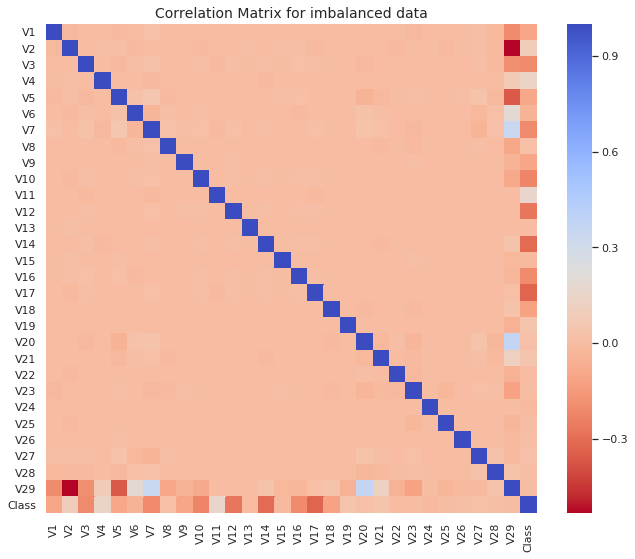

In [49]:
# We use the cleansed dataframe with imputed values to generate correlation:
f, ax = plt.subplots(figsize=(11, 9))
corr = testSetClean.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax)
ax.set_title("Correlation Matrix for imbalanced data", fontsize=14)
plt.show()

#### Insights:
1. Due to heavy imbalance, the correlation matrix is not insightful.

2. We will treat class imbalance and regenerate the correlation matrix.

3. The method we will use is undersampling the majority class.

In [50]:
# Shuffling the data before creating smaller sample
shuf = testSetClean.sample(frac=1)

shuf1 = shuf.loc[shuf['Class'] == 1]
shuf0 = shuf.loc[shuf['Class'] == 0][:len(testOneClean)]

shuf_1_0 = pd.concat([shuf1, shuf0])

# Shuffle dataframe rows
shuf_df = shuf_1_0.sample(frac=1, random_state=42)
shuf_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,Class
204079,1.862102,-0.124052,-1.989752,0.382609,0.473032,-0.674517,0.298621,-0.282416,0.802053,-0.989431,-0.491112,-6.163537,1.366524,-1.886162,-0.194861,0.086837,0.978546,0.055604,0.189131,0.150727,-0.204158,-0.511441,0.077874,0.388335,-0.149759,-0.120980,-0.019579,0.006155,0.098474,1
6529,-1.585505,2.844795,-4.137422,2.357096,-1.405043,-1.879437,-3.513687,1.515607,-1.207166,-6.234561,3.715874,-7.333714,1.361193,-6.608068,-0.481069,-2.602478,-4.835112,-0.553026,0.351949,0.302735,0.371447,-0.546869,-0.076584,-0.425550,0.123644,0.321985,0.264028,0.132817,-0.386398,1
152295,-17.537592,2.844795,-20.134613,11.122771,-14.571080,-0.381622,-23.928661,-4.724921,-8.603038,-15.231833,3.715874,-12.893520,-0.109628,-3.547230,-2.177824,-10.402068,-4.835112,-8.314092,2.435823,0.302735,-4.352213,2.389041,2.019128,-0.224999,-1.085997,-0.071803,-3.838198,-0.802564,-0.346620,1
141257,-0.937843,3.462889,-6.445104,4.932199,-2.233983,-2.291561,-5.695594,1.338825,-2.976249,-8.099119,7.182967,-9.445943,-0.314620,-12.991466,-0.136359,-6.367524,-12.734394,-3.845130,1.007667,1.129532,1.066550,-0.521657,-0.319917,-0.405859,0.906802,1.165784,1.374495,0.729889,-0.390908,1
150667,-10.850282,6.727466,-16.760583,8.425832,-10.252697,-4.192171,-2.321499,7.168288,-3.683242,-4.040631,8.030708,-16.060306,0.270530,-6.424372,-0.241095,-11.866731,-15.486990,-5.748652,0.266272,-0.646818,2.541637,0.135535,-1.023967,0.406265,-0.093014,-0.026232,0.505515,-0.411682,-0.039126,1


In [114]:
print('Distribution of the Classes in smaller dataset')
print(shuf_df['Class'].value_counts()/len(shuf_df))


Distribution of the Classes in smaller dataset
1    0.5
0    0.5
Name: Class, dtype: float64


In [113]:
enable_plotly_in_cell()

temp_us = shuf_df["Class"].value_counts()
shuf_us = pd.DataFrame({'Class': temp_us.index,'values': temp_us.values})

trace = go.Bar(
    x = ['Not Fraud', 'Fraud'],y = shuf_us['values'],
    name="Credit Card Fraud Class - data unbalance (Not fraud = 0, Fraud = 1)",
    marker=dict(color=["Blue",'Red']),
    text= shuf_us['values'],
    textposition = 'auto'
   
)
shuf_us1 = [trace]
layout = go.Layout(dict(dict(xaxis = dict(title = 'Class', showticklabels=True), 
          yaxis = dict(title = 'Number of transactions'),
          hovermode = 'closest',width=600
         )))



fig = go.Figure(data=shuf_us1, layout=layout)

fig.update_layout(
    title={
        'text': 'Equally distributed data',
        'y':0.88,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})


iplot(fig, filename='class')

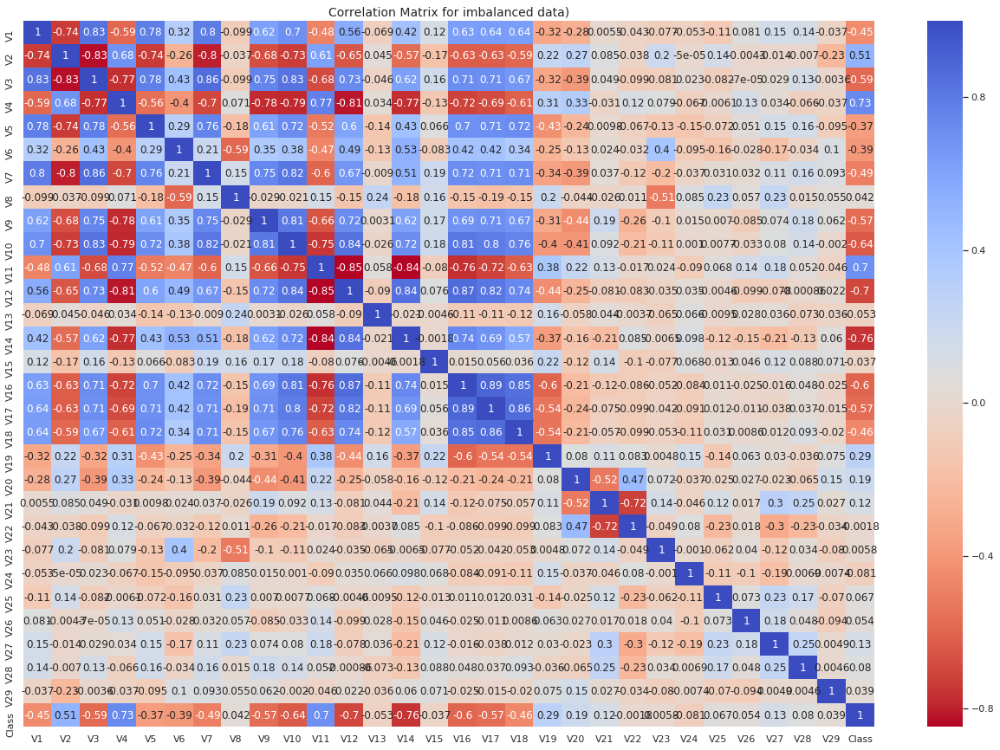

In [52]:
#Checking correlation matrix with smaller dataset:
f, ax = plt.subplots(figsize=(22, 15))
corr = shuf_df.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':12},annot = True, ax=ax)
ax.set_title("Correlation Matrix for imbalanced data)", fontsize=14)
plt.show()

#### Insights:

1. We will consider significant correlation coefficient of greater than |0.60|

2. Positively correlated > |0.60| : V4, V11

3. Positive correlations with Class: The higher the feature value the probability increases that it will be Class 1

4. Negatively correlated > |0.60| : V10, V12, V14

5. Negative Correlations with Class: The lower the feature value the more likely it will be Class 1


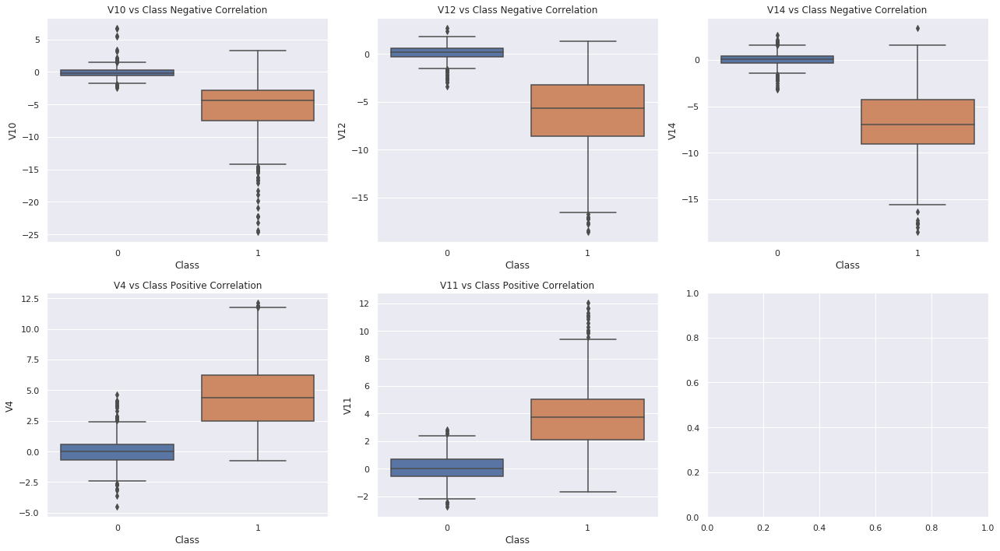

In [53]:
# Outlier observation through boxplots:
f, axes = plt.subplots(ncols=3, nrows=2, figsize=(18,10))

sns.boxplot(x="Class", y="V10", data=shuf_df, ax=axes[0,0])
axes[0,0].set_title('V10 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V12", data=shuf_df, ax=axes[0,1])
axes[0,1].set_title('V12 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V14", data=shuf_df, ax=axes[0,2])
axes[0,2].set_title('V14 vs Class Negative Correlation')


sns.boxplot(x="Class", y="V4", data=shuf_df, ax=axes[1,0])
axes[1,0].set_title('V4 vs Class Positive Correlation')

sns.boxplot(x="Class", y="V11", data=shuf_df, ax=axes[1,1])
axes[1,1].set_title('V11 vs Class Positive Correlation')
f.tight_layout()
plt.show()

#### Insights:

1. For the above features which are a significant predictor of our response variable, we see presence of Outliers.

2. We will remove outliers from these variables for better prediction accuracy.

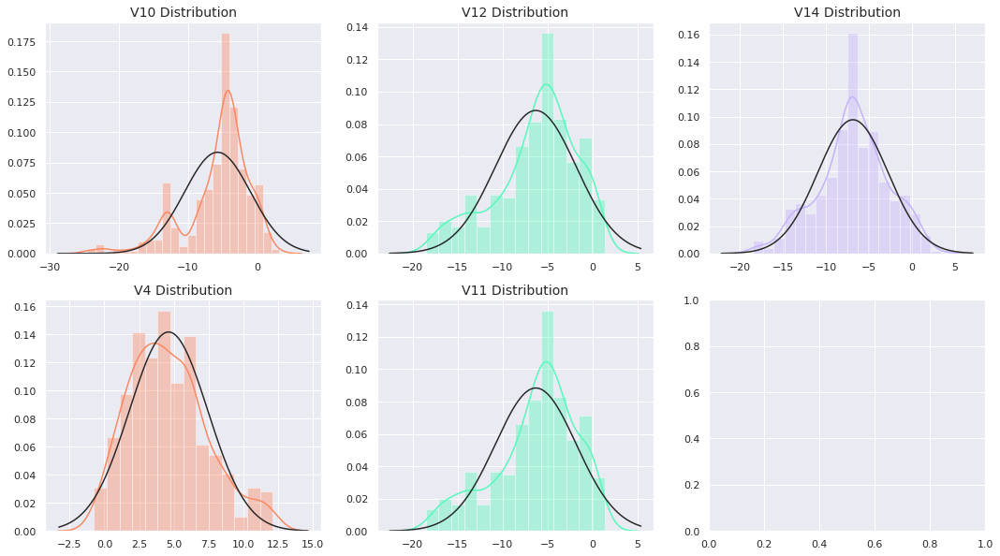

In [54]:
from scipy.stats import norm

f, axes = plt.subplots(ncols=3, nrows=2, figsize=(18,10))

v10_dist = shuf_df['V10'].loc[shuf_df['Class'] == 1].values
sns.distplot(v10_dist,ax=axes[0,0], fit=norm, color='#FB8861')
axes[0,0].set_title('V10 Distribution', fontsize=14)

v12_dist = shuf_df['V12'].loc[shuf_df['Class'] == 1].values
sns.distplot(v12_dist,ax=axes[0,1], fit=norm, color='#56F9BB')
axes[0,1].set_title('V12 Distribution', fontsize=14)

v14_dist = shuf_df['V14'].loc[shuf_df['Class'] == 1].values
sns.distplot(v14_dist,ax=axes[0,2], fit=norm, color='#C5B3F9')
axes[0,2].set_title('V14 Distribution', fontsize=14)

v4_dist = shuf_df['V4'].loc[shuf_df['Class'] == 1].values
sns.distplot(v4_dist,ax=axes[1,0], fit=norm, color='#FB8861')
axes[1,0].set_title('V4 Distribution', fontsize=14)

v11_dist = shuf_df['V12'].loc[shuf_df['Class'] == 1].values
sns.distplot(v11_dist,ax=axes[1,1], fit=norm, color='#56F9BB')
axes[1,1].set_title('V11 Distribution', fontsize=14)

plt.show()

1. Distributions: We start by visualizing the distribution of the columns of which we would remove outliers. 

2. V14 is the only column that has a Gaussian distribution compared to others.

3. Therefore, we will use the Interquartile Range Method for outlier removal.

In [55]:
OutZero = testSetClean[testSetClean.Class == 0]
OutOne = testSetClean[testSetClean.Class == 1]
len(OutOne)

423

## First calculate all outliers and store them separately.
## Then remove outliers one by one for these columns

## If we calculate and remove simultaneously it will affect the distribution of the latter columns.

In [56]:
#For dataset OutOne:

#for top 3 negatively correlated columns:

# Capturing outliers from V10
v10 = OutOne['V10'].values
q25, q75 = np.percentile(v10, 25), np.percentile(v10, 75)
v10_iqr = q75 - q25
v10_cut_off = v10_iqr * 1.5
v10_lower, v10_upper = q25 - v10_cut_off, q75 + v10_cut_off
outliers10 = [x for x in v10 if x < v10_lower or x > v10_upper]
print('Feature V10 Outliers for Class 1: {}'.format(len(outliers10)))

# Capturing outliers from V12
v12 = OutOne['V12'].values
q25, q75 = np.percentile(v12, 25), np.percentile(v12, 75)
v12_iqr = q75 - q25
v12_cut_off = v12_iqr * 1.5
v12_lower, v12_upper = q25 - v12_cut_off, q75 + v12_cut_off
outliers12 = [x for x in v12 if x < v12_lower or x > v12_upper]
print('Feature V12 Outliers for Class 1: {}'.format(len(outliers12)))

# Capturing outliers from V14
v14 = OutOne['V14'].values
q25, q75 = np.percentile(v14, 25), np.percentile(v14, 75)
v14_iqr = q75 - q25
v14_cut_off = v14_iqr * 1.5
v14_lower, v14_upper = q25 - v14_cut_off, q75 + v14_cut_off
outliers14 = [x for x in v14 if x < v14_lower or x > v14_upper]
print('Feature V14 Outliers Class 1: {}'.format(len(outliers14)))


#for top 2 Posiively correlated columns:

# Capturing outliers from V4
v4 = OutOne['V4'].values
q25, q75 = np.percentile(v4, 25), np.percentile(v4, 75)
v4_iqr = q75 - q25
v4_cut_off = v4_iqr * 1.5
v4_lower, v4_upper = q25 - v4_cut_off, q75 + v4_cut_off
outliers4 = [x for x in v4 if x < v4_lower or x > v4_upper]
print('Feature V4 Outliers for Class 1: {}'.format(len(outliers4)))

# Capturing outliers from V11
v11 = OutOne['V11'].values
q25, q75 = np.percentile(v11, 25), np.percentile(v11, 75)
v11_iqr = q75 - q25
v11_cut_off = v11_iqr * 1.5
v11_lower, v11_upper = q25 - v11_cut_off, q75 + v11_cut_off
outliers11 = [x for x in v11 if x < v11_lower or x > v11_upper]
print('Feature V11 Outliers for Class 1: {}'.format(len(outliers11)))



# Removing the captured Outliers:

new_df1 = OutOne.drop(OutOne[(OutOne['V10'] > v10_upper) | (OutOne['V10'] < v10_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df1)))

new_df1 = new_df1.drop(new_df1[(new_df1['V12'] > v12_upper) | (new_df1['V12'] < v12_lower)].index)   ## NOTE : Not OutOne['V12'] BUT new_df1['V12'] and so on (so that V10 outliers are already removed)
print('Number of Instances after outliers removal: {}'.format(len(new_df1)))
new_df1 = new_df1.drop(new_df1[(new_df1['V14'] > v14_upper) | (new_df1['V14'] < v14_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df1)))

new_df1 = new_df1.drop(new_df1[(new_df1['V4'] > v4_upper) | (new_df1['V4'] < v4_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df1)))
new_df1 = new_df1.drop(new_df1[(new_df1['V11'] > v11_upper) | (new_df1['V11'] < v11_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df1)))

Feature V10 Outliers for Class 1: 24
Feature V12 Outliers for Class 1: 11
Feature V14 Outliers Class 1: 8
Feature V4 Outliers for Class 1: 8
Feature V11 Outliers for Class 1: 13
Number of Instances after outliers removal: 399
Number of Instances after outliers removal: 388
Number of Instances after outliers removal: 383
Number of Instances after outliers removal: 377
Number of Instances after outliers removal: 373


In [57]:
#For dataset OutZero:

#for top 3 negatively correlated columns:

# Capturing outliers from V10
v10 = OutZero['V10'].values
q25, q75 = np.percentile(v10, 25), np.percentile(v10, 75)
v10_iqr = q75 - q25
v10_cut_off = v10_iqr * 1.5
v10_lower, v10_upper = q25 - v10_cut_off, q75 + v10_cut_off
outliers10 = [x for x in v10 if x < v10_lower or x > v10_upper]
print('Feature V10 Outliers for Class 0: {}'.format(len(outliers10)))

# Capturing outliers from V12
v12 = OutZero['V12'].values
q25, q75 = np.percentile(v12, 25), np.percentile(v12, 75)
v12_iqr = q75 - q25
v12_cut_off = v12_iqr * 1.5
v12_lower, v12_upper = q25 - v12_cut_off, q75 + v12_cut_off
outliers12 = [x for x in v12 if x < v12_lower or x > v12_upper]
print('Feature V12 Outliers for Class 0: {}'.format(len(outliers12)))

# Capturing outliers from V14
v14 = OutZero['V14'].values
q25, q75 = np.percentile(v14, 25), np.percentile(v14, 75)
v14_iqr = q75 - q25
v14_cut_off = v14_iqr * 1.5
v14_lower, v14_upper = q25 - v14_cut_off, q75 + v14_cut_off
outliers14 = [x for x in v14 if x < v14_lower or x > v14_upper]
print('Feature V14 Outliers for Class 0: {}'.format(len(outliers14)))


#for top 2 positively correlated columns:

# Capturing outliers from V4
v4 = OutZero['V4'].values
q25, q75 = np.percentile(v4, 25), np.percentile(v4, 75)
v4_iqr = q75 - q25
v4_cut_off = v4_iqr * 1.5
v4_lower, v4_upper = q25 - v4_cut_off, q75 + v4_cut_off
outliers4 = [x for x in v4 if x < v4_lower or x > v4_upper]
print('Feature V4 Outliers for Class 0: {}'.format(len(outliers4)))

# Capturing outliers from V11
v11 = OutZero['V11'].values
q25, q75 = np.percentile(v11, 25), np.percentile(v11, 75)
v11_iqr = q75 - q25
v11_cut_off = v11_iqr * 1.5
v11_lower, v11_upper = q25 - v11_cut_off, q75 + v11_cut_off
outliers11 = [x for x in v11 if x < v11_lower or x > v11_upper]
print('Feature V11 Outliers for Class 0: {}'.format(len(outliers11)))


new_df0 = OutZero.drop(OutZero[(OutZero['V10'] > v10_upper) | (OutZero['V10'] < v10_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df0)))

new_df0 = new_df0.drop(new_df0[(new_df0['V12'] > v12_upper) | (new_df0['V12'] < v12_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df0)))
new_df0 = new_df0.drop(new_df0[(new_df0['V14'] > v14_upper) | (new_df0['V14'] < v14_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df0)))

new_df0 = new_df0.drop(new_df0[(new_df0['V4'] > v4_upper) | (new_df0['V4'] < v4_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df0)))
new_df0 = new_df0.drop(new_df0[(new_df0['V11'] > v11_upper) | (new_df0['V11'] < v11_lower)].index)
print('Number of Instances after outliers removal: {}'.format(len(new_df0)))

Feature V10 Outliers for Class 0: 15201
Feature V12 Outliers for Class 0: 15778
Feature V14 Outliers for Class 0: 16759
Feature V4 Outliers for Class 0: 13322
Feature V11 Outliers for Class 0: 1083
Number of Instances after outliers removal: 240606
Number of Instances after outliers removal: 226262
Number of Instances after outliers removal: 216421
Number of Instances after outliers removal: 207595
Number of Instances after outliers removal: 207369


In [58]:
print(len(new_df0))
print(len(new_df1))

207369
373


In [0]:
clean_df = pd.concat([new_df0, new_df1])

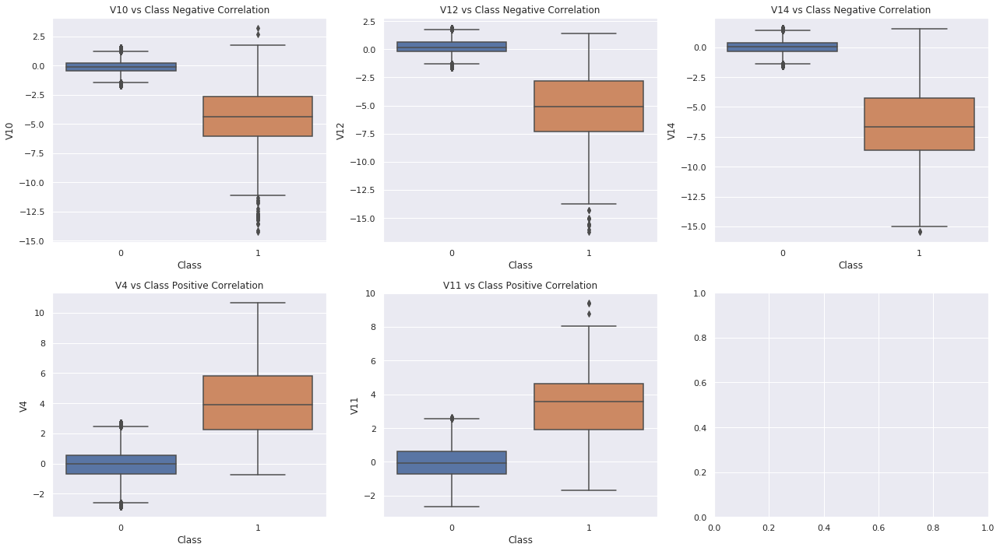

In [60]:
#Rechecking change in boxplots after removing outliers: 
f, axes = plt.subplots(ncols=3, nrows=2, figsize=(18,10))

sns.boxplot(x="Class", y="V10", data=clean_df, ax=axes[0,0])
axes[0,0].set_title('V10 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V12", data=clean_df, ax=axes[0,1])
axes[0,1].set_title('V12 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V14", data=clean_df, ax=axes[0,2])
axes[0,2].set_title('V14 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V4", data=clean_df, ax=axes[1,0])
axes[1,0].set_title('V4 vs Class Positive Correlation')

sns.boxplot(x="Class", y="V11", data=clean_df, ax=axes[1,1])
axes[1,1].set_title('V11 vs Class Positive Correlation')
f.tight_layout()
plt.show()

#### Steps:
1. Check how imbalanced is our class.

2. We will undersample records from Class 0 to the same number of records as Class 1, thus ensuring we get a 50:50 ratio.

3. We will apply two different classification models to the data.

4. Compare the model performance of each.

5. Compare the performance against test data.

6. We aim to obtain a model with high recall to correctly categorize the minority class.

#### Undersampling and Cross Validation:

1. If we undersample or oversample data before cross validating. we will be directly influencing the validation set before implementing cross-validation causing a "data leakage" problem. 

2. If we get the minority class (1) in our case, and create the synthetic points before cross validating we have a certain influence on the "validation set" of the cross validation process. 

3. Therefore, we undersample datapoints during cross-validation

In [61]:
print('Class 0', round(clean_df['Class'].value_counts()[0]/len(clean_df) * 100,2), '% of the dataset')
print('Class 1', round(clean_df['Class'].value_counts()[1]/len(clean_df) * 100,2), '% of the dataset')

Class 0 99.82 % of the dataset
Class 1 0.18 % of the dataset


In [0]:
X = clean_df.drop('Class', axis=1)
y = clean_df['Class']
sss = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)

In [0]:

# original_Xtrain, original_Xtest, original_ytrain, original_ytest = train_test_split(X, y, test_size=0.2, random_state=42)

In [0]:
for train_index, test_index in sss.split(X, y):
    original_Xtrain, original_Xtest = X.iloc[train_index], X.iloc[test_index]
    original_ytrain, original_ytest = y.iloc[train_index], y.iloc[test_index]


In [0]:

original_Xtrain = original_Xtrain.values
original_Xtest = original_Xtest.values
original_ytrain = original_ytrain.values
original_ytest = original_ytest.values

In [66]:
# Implementing NearMiss Technique for undersampling
# Distribution of NearMiss (Just to see how it distributes the labels, we won't use these variables)
X_nearmiss, y_nearmiss = NearMiss().fit_sample(X.values, y.values)
print('NearMiss Label Distribution: {}'.format(Counter(y_nearmiss)))

NearMiss Label Distribution: Counter({0: 373, 1: 373})


In [0]:
# 4 Classifiers with optimal parameters:
#Logistic Regression:
log_reg_params = {"penalty": ['l1','l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
grid_log_reg = GridSearchCV(LogisticRegression(), log_reg_params)

In [0]:
#K nearest neighbor:
knears_params = {"n_neighbors": list(range(2,5,1)), 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']}
grid_knears = GridSearchCV(KNeighborsClassifier(), knears_params)

In [0]:
# Create empty arrays to store values later:
accuracy_lst = []
precision_lst = []
recall_lst = []
f1_lst = []
auc_lst = []

In [70]:
# Cross Validating the right way
# Parameters
for train, test in sss.split(original_Xtrain, original_ytrain):
    pipeline = imbalanced_make_pipeline(NearMiss(sampling_strategy='majority'), grid_log_reg)
    model = pipeline.fit(original_Xtrain[train], original_ytrain[train])
    best_est_logreg = grid_log_reg.best_estimator_
    prediction = best_est_logreg.predict(original_Xtrain[test])
    
    accuracy_lst.append(pipeline.score(original_Xtrain[test], original_ytrain[test]))
    precision_lst.append(precision_score(original_ytrain[test], prediction))
    recall_lst.append(recall_score(original_ytrain[test], prediction))
    f1_lst.append(f1_score(original_ytrain[test], prediction))
    auc_lst.append(roc_auc_score(original_ytrain[test], prediction))
    
print("accuracy: {}".format(np.mean(accuracy_lst)))
print("precision: {}".format(np.mean(precision_lst)))
print("recall: {}".format(np.mean(recall_lst)))
print("f1: {}".format(np.mean(f1_lst)))
print("auc: {}".format(np.mean(auc_lst)))

accuracy: 0.8378400274666712
precision: 0.012029988875503963
recall: 0.9800000000000001
f1: 0.0237218801461083
auc: 0.9087926747313843


In [71]:
# KNN
for train, test in sss.split(original_Xtrain, original_ytrain):
    pipeline = imbalanced_make_pipeline(NearMiss(sampling_strategy='majority'), grid_knears) # NearMiss happens during Cross Validation not before..
    model = pipeline.fit(original_Xtrain[train], original_ytrain[train])
    best_est_knn = grid_knears.best_estimator_
    prediction = best_est_knn.predict(original_Xtrain[test])
    
    accuracy_lst.append(pipeline.score(original_Xtrain[test], original_ytrain[test]))
    precision_lst.append(precision_score(original_ytrain[test], prediction))
    recall_lst.append(recall_score(original_ytrain[test], prediction))
    f1_lst.append(f1_score(original_ytrain[test], prediction))
    auc_lst.append(roc_auc_score(original_ytrain[test], prediction))
    
print("accuracy: {}".format(np.mean(accuracy_lst)))
print("precision: {}".format(np.mean(precision_lst)))
print("recall: {}".format(np.mean(recall_lst)))
print("f1: {}".format(np.mean(f1_lst)))
print("auc: {}".format(np.mean(auc_lst)))

accuracy: 0.9024121721659852
precision: 0.03150930191677128
recall: 0.9481355932203389
f1: 0.059974286647885046
auc: 0.9252330925179258


#### Insights:

1. As we can observe, both models have good cross validation recall score.

2. The area under ROC values are best for KNN

3. Let us check how the models perform on test data.

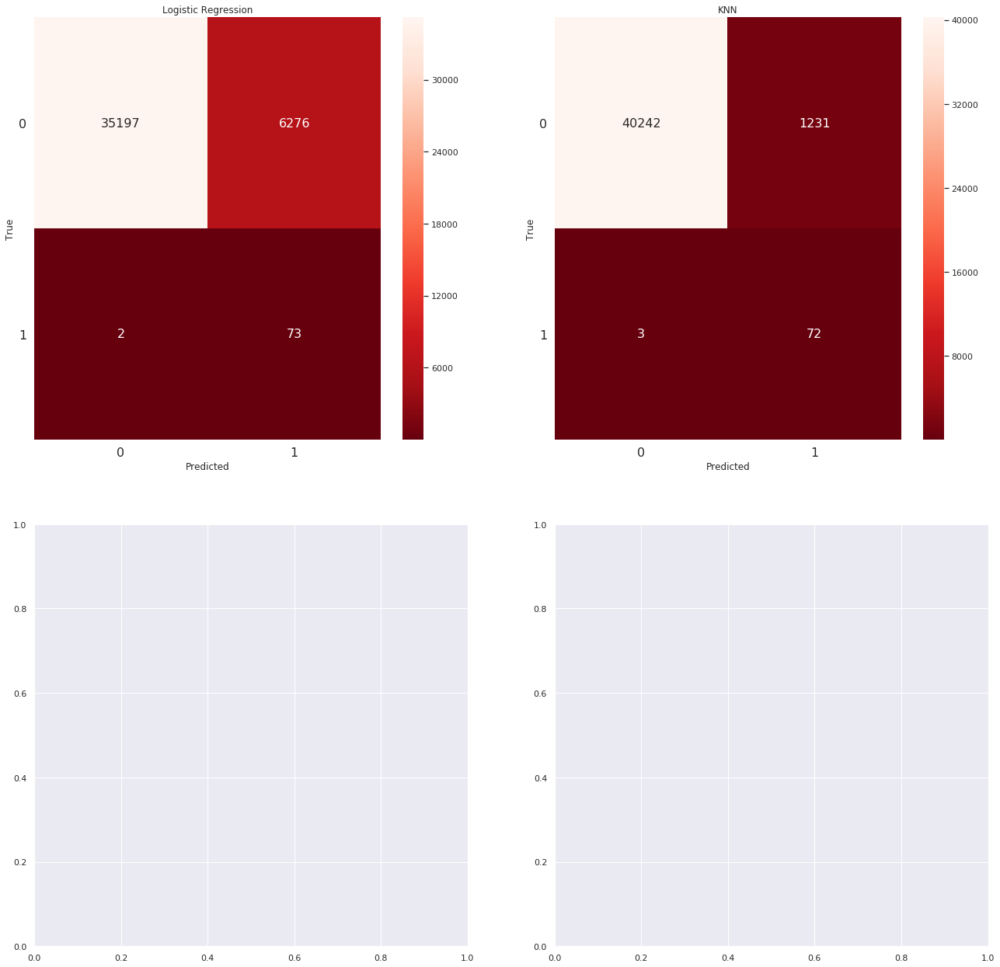

In [81]:
# Test data:
y_pred_log_reg = best_est_logreg.predict(original_Xtest)
y_pred_knear = best_est_knn.predict(original_Xtest)


log_reg_cf = confusion_matrix(original_ytest, y_pred_log_reg)
kneighbors_cf = confusion_matrix(original_ytest, y_pred_knear)

fig, ax = plt.subplots(2, 2,figsize=(22,22))

sns.heatmap(log_reg_cf, ax=ax[0][0], annot=True,annot_kws={"size": 16}, cmap = 'Reds_r', fmt='g')
ax[0][0].set(title="Logistic Regression", xlabel="Predicted", ylabel="True")
ax[0][0].set_xticklabels(['0', '1'], fontsize=16, rotation=360)
ax[0][0].set_yticklabels(['0', '1'], fontsize=16, rotation=360)

sns.heatmap(kneighbors_cf, ax=ax[0][1], annot=True,annot_kws={"size": 16}, cmap= 'Reds_r', fmt='g')
ax[0][1].set(title="KNN", xlabel="Predicted", ylabel="True")
ax[0][1].set_xticklabels(['0', '1'], fontsize=16, rotation=360)
ax[0][1].set_yticklabels(['0', '1'], fontsize=16, rotation=360)



plt.show()

#### Confusion matrix interpretation:

True Negatives (Top-Left Square): Number of correct classifications of the negative (Not Fraud) "0" class.


False Positives (Top-Right Square): Number of incorrect classifications of the positive (Fraud) "1" class.


False Negatives (Bottom-Left Square): Number of incorrect classifications of the negative (Not Fraud) "0" class


True Positives (Bottom-Right Square): Number of correct classifications of the positive (Fraud) "1" class.

In [66]:
print("Logistic regression:")
print("Precision: {}".format(precision_score(original_ytest, y_pred_log_reg)))
print("Recall: {}".format(recall_score(original_ytest, y_pred_log_reg)))
print("F1 score: {}".format(f1_score(original_ytest, y_pred_log_reg)))
print("AUROC: {}".format(roc_auc_score(original_ytest, y_pred_log_reg)))

Logistic regression:
Precision: 0.01149787368089463
Recall: 0.9733333333333334
F1 score: 0.022727272727272728
AUROC: 0.9110029818596839


In [67]:
print("KNN:")
print("Precision: {}".format(precision_score(original_ytest, y_pred_knear)))
print("Recall: {}".format(recall_score(original_ytest, y_pred_knear)))
print("F1 score: {}".format(f1_score(original_ytest, y_pred_knear)))
print("AUROC: {}".format(roc_auc_score(original_ytest, y_pred_knear)))

KNN:
Precision: 0.05525709900230238
Recall: 0.96
F1 score: 0.10449927431059505
AUROC: 0.9651590191208739


In [68]:
print("AUROC Logistic Regression: {}".format(roc_auc_score(original_ytest, y_pred_log_reg)))
print("AUROC KNN: {}".format(roc_auc_score(original_ytest, y_pred_knear)))


AUROC Logistic Regression: 0.9110029818596839
AUROC KNN: 0.9651590191208739


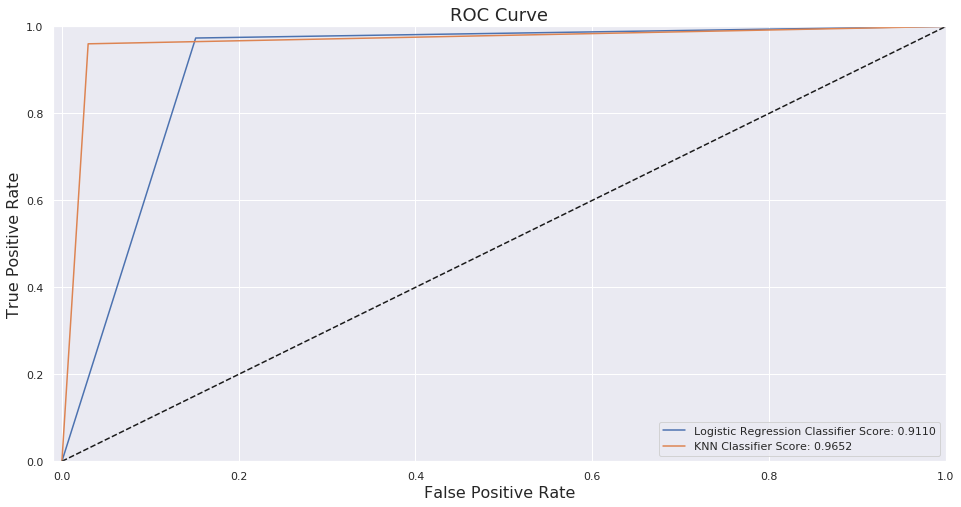

In [69]:
log_fpr, log_tpr, log_thresold = roc_curve(original_ytest, y_pred_log_reg)
knear_fpr, knear_tpr, knear_threshold = roc_curve(original_ytest, y_pred_knear)

def graph_roc_curve_multiple(log_fpr, log_tpr, knear_fpr, knear_tpr):
    plt.figure(figsize=(16,8))
    plt.title('ROC Curve', fontsize=18)
    plt.plot(log_fpr, log_tpr, label='Logistic Regression Classifier Score: {:.4f}'.format(roc_auc_score(original_ytest, y_pred_log_reg)))
    plt.plot(knear_fpr, knear_tpr, label='KNN Classifier Score: {:.4f}'.format(roc_auc_score(original_ytest, y_pred_knear)))
    
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    # 
    plt.legend()
    
graph_roc_curve_multiple(log_fpr, log_tpr, knear_fpr, knear_tpr)
plt.show()

#### Conclusion:

1. Logistic Regression does have negative impact due to multicollinearity in the independent variables, but since we are not focussing on feature importance, I did not treat it. Possible steps were performing PCA.

2. As future steps, would try SMOTE instead of undersampling and compare results. Undersampling does cause a loss in information, for faster computation I chose undersampling.
